### RJI Image Classification and Ranking Project Update: January 23, 2020

#### Project Overview:
Currently we are attempting to find a ranking for images in the RJI library dating between 1999 and 2018. To do this we needed to find a way to tell the machine what a "good" and "bad" picture looked like. We have now developed several ideas on how to do this. The first way involves pulling the metadata off the image and finding a Photo Mechanic color classification given to certain images by the RJI editors. The second is use a more complete labeled (with aesthetic scores/votes) image set called the AVA Dataset to train the model. We expect both ideas will likely be incorporated into the project in some way and used to get the most accurate results.

In [1]:
'''
SCRIPT IMPORTS
'''
#standard ML/Image Processing imports
import numpy as np
import pandas as pd
import math, pandas
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

from PIL import Image

#pytorch imports
import torch
import torch.optim as optim
import torchvision.models as models

from torch import nn
from torch import optim
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision import datasets, transforms

# no one likes irrelevant warnings
import warnings  
warnings.filterwarnings('ignore')

from image_classification_file import ImageFolderWithPathsAndRatings, ImageFolderWithPaths

"""
SCRIPT GLOBAL VARS
"""
# root directory where the images are stored
data_dir = "/mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump"
limit_num_pictures = None
rated_indices = []
ratings = []
bad_indices = []
# we load the pretrained model, the argument pretrained=True implies to load the ImageNet weights for the pre-trained model
vgg16 = models.vgg16(pretrained=True)

#### Photo Mechanic Color Classification:
We have developed a tool to comb through the XMP metadata stored in each image to find the color classification stored inside. Approximately 25% of all the images have a color classification. In addition to this, the majority of classifications are high rankings that disproportionately skew the data in a high rating direction and lead to bad results. To address this we have scaled the results to fit on a standardized plane and can better compare the results. The code below defines the datasets and loads a model we have previously trained on 2017/Fall/Dump images with color classifications. 

In [2]:
# check GPU availability
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device that will be used: {}".format(device))

vgg16.to(device) # loads the model onto the device (CPU or GPU)

for param in vgg16.parameters():
    param.requires_grad = False #freeze all convolution weights
network = list(vgg16.classifier.children())[:-1] #remove fully connected layer
network.extend([nn.Linear(4096, 8)]) #add new layer of 4096->100 (rating scale with 1 decimal - similar to 1 hot encoding)
vgg16.classifier = nn.Sequential(*network)

criterion = nn.CrossEntropyLoss() # loss function
optimizer = optim.SGD(vgg16.parameters(), lr=0.4, momentum=0.9) # optimizer

vgg16 #print out the model to ensure our network is correct

vgg16.load_state_dict(torch.load('models/Jan16_All_2017_Fall_Dump_only_labels.pt'))

Device that will be used: cpu


<All keys matched successfully>

#### Testing:
Once we load in the previously trained model, we prepare the machine to test itself. This is done via the entire remaining unlabeled image set. It follows in the code below.


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170825_Pitbulls_EJ/20170825_voxPitbulls_EJ_530.JPG
Classification for test image #0: [4060.009765625, -523.506103515625, 846.6934204101562, -1134.21240234375, -2821.44189453125, -179.89990234375, -169.06903076171875, -76.46893310546875]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []


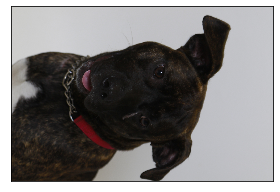


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170913_ShawnVeronika_OL/20170913_ShawnVeronika_OL_113.JPG
Classification for test image #1: [6994.310546875, -2236.862060546875, -1389.2103271484375, -1476.5888671875, -881.1019287109375, -426.9066467285156, -400.8218078613281, -181.2432098388672]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170904_HeartofAmericaMarathon_EJ/20170904_HeartofAmericaMarathon_EJ_907.JPG
Classification for test image #2: [4822.0458984375, -684.7042846679688, -3125.77978515625, 1334.373291015625, -1920.560791015625, -180.30638122558594, -169.1510009765625, -76.61308288574219]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171108_HickmanWrestling_EJ/20171108_HickmanWrestling_EJ_306.JPG
Classification for test ima

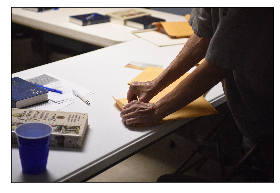


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170914_democracyplay_nc/20170914_democracyplay_nc_268.JPG
Classification for test image #21: [10528.9111328125, -3488.023681640625, -4367.431640625, -363.2073974609375, -1523.7392578125, -332.2079162597656, -312.4144592285156, -141.21934509277344]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171013_featurehunt_JJ/20171013_featurehunt_JJ_012.JPG
Classification for test image #22: [4056.852294921875, -1893.45654296875, -853.546630859375, -50.04927062988281, -755.892333984375, -212.2256622314453, -199.986572265625, -90.27604675292969]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171203_nightbball_JJ/20171203_normstewartlate_JJ_298.JPG
Classification for test image #23: [5083.7490234375,

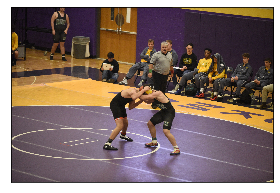


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170821_Eclipse_jd/20170821_Eclipse_CoopersLanding_jd_108.JPG
Classification for test image #41: [3478.398681640625, -1432.1876220703125, -679.6063232421875, -1846.580078125, 1096.74560546875, -260.31756591796875, -243.98696899414062, -110.78850555419922]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171110_GirlsOnTheRun_EJ/20171111_GirlsOnTheRun_EJ_149.JPG
Classification for test image #42: [4466.88623046875, -2291.90576171875, -3337.88330078125, 314.46533203125, 1182.2039794921875, -141.88381958007812, -133.12376403808594, -60.05470275878906]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171013_helicoptertraining_JJ/20171013_helicoptertraining_JJ_245.JPG
Classification for test image #4

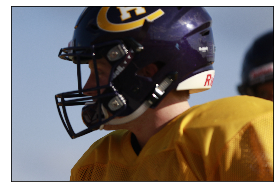


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171027_featuresheep_JJ/20171027_featuresheep_JJ_158.JPG
Classification for test image #61: [6583.1748046875, -2777.009033203125, -528.2926025390625, -2023.970703125, -501.25030517578125, -317.9166564941406, -298.95782470703125, -135.0648956298828]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170829_ShermanHighway_ec/20170829_shermanhighway_ec_001.JPG
Classification for test image #62: [3909.313720703125, -4143.783203125, 1356.1201171875, -779.4072265625, 181.42506408691406, -220.45399475097656, -207.32940673828125, -93.7425765991211]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170901_BattleRockbridgeFootball_OL/20170901_BattleRockbridgeFootball_OL_565.JPG
Classification for test im

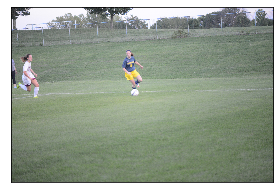


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170825_Pitbulls_EJ/20170825_voxPitbulls_EJ_110.JPG
Classification for test image #81: [4291.60400390625, -1466.0667724609375, 464.842529296875, -1386.497802734375, -1435.6287841796875, -197.59951782226562, -185.79290771484375, -84.08222961425781]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20171002_mudvolleyball_jd/20171002CAFNRmudvolleyball_jd_125.JPG
Classification for test image #82: [9816.880859375, 996.7487182617188, -8907.2333984375, -393.6971435546875, -630.4736328125, -372.4407958984375, -350.36102294921875, -158.4541473388672]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170908_BooneFootball_OL/20170908_BooneFootball_OL_272.JPG
Classification for test image #83: [9056.8330078125, -

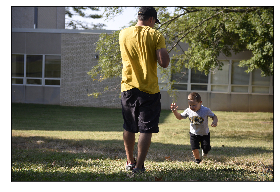


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170913_ShawnVeronika_OL/20170913_ShawnVeronika_OL_072.JPG
Classification for test image #101: [10061.576171875, -2386.989990234375, -5916.47705078125, 82.82225036621094, -1334.73193359375, -214.27281188964844, -200.61196899414062, -90.73041534423828]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171028_StephensCollegeSoccer_EJ/20171028_StephensCollegeSoccer_EJ_476.JPG
Classification for test image #102: [9108.318359375, 255.24693298339844, -6214.30126953125, 149.29351806640625, -2852.072265625, -189.45323181152344, -178.00221252441406, -80.2215347290039]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171015_featurehunt_JJ/20171015_featurehunt_JJ_058.JPG
Classification for test image #103: 

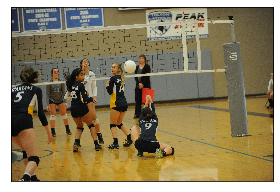


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170906_CartwrightPresser_EJ/20170906_CartwrightPresser_EJ_045.JPG
Classification for test image #121: [2360.677978515625, -2847.0322265625, -784.2665405273438, -43.85895538330078, 1818.103271484375, -213.04241943359375, -199.82568359375, -90.35164642333984]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171002_toltonsoftball_EJ/20171002_toltonsoftball_EJ_472.JPG
Classification for test image #122: [13048.0625, 14.780292510986328, -11201.361328125, -657.6211547851562, -473.56317138671875, -308.3128356933594, -289.9193115234375, -131.1695556640625]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170905_BattleTennisGirls_ec/20170905_battletennis_ec_093.JPG
Classification for test image #1

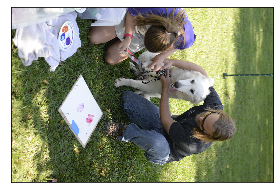


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170922_battlefootball_Ec/20170922_fridaynightsights_ec_059.JPG
Classification for test image #141: [15847.982421875, -2552.347900390625, -11677.00390625, -1405.296142578125, 516.6410522460938, -308.2342224121094, -289.7309875488281, -131.23500061035156]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170825_Pitbulls_EJ/20170825_voxPitbulls_EJ_1204.JPG
Classification for test image #142: [4129.8544921875, -1822.9468994140625, 516.36083984375, -1688.391845703125, -470.693115234375, -281.3266296386719, -264.541259765625, -119.74468994140625]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170922_battlefootball_Ec/20170922_fridaynightsights_ec_132.JPG
Classification for test image #143:

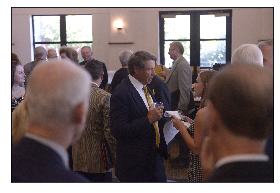


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170922_ToltonFNSfb_EJ/20170922_ToltonFNSfb_EJ738.JPG
Classification for test image #161: [6939.04052734375, -892.7078857421875, -4234.90087890625, -862.95849609375, -599.64306640625, -147.25210571289062, -138.3123321533203, -62.76831817626953]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20171009_welders_nc/20171009_welding_nc_243.JPG
Classification for test image #162: [4340.4970703125, 1546.1619873046875, -3645.71630859375, -1595.8018798828125, 52.84324645996094, -295.4834289550781, -277.5894775390625, -125.82156372070312]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170904_HeartofAmericaMarathon_EJ/20170904_HeartofAmericaMarathon_EJ_216.JPG
Classification for test image #163: [7832.14

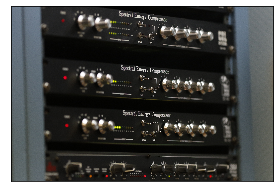


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170904_HeartofAmericaMarathon_EJ/20170904_HeartofAmericaMarathon_EJ_869.JPG
Classification for test image #181: [5295.8212890625, -1477.2789306640625, -2125.052001953125, 250.3593292236328, -1376.30078125, -240.4594268798828, -225.8017120361328, -102.16490936279297]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170909_BoonevilleFootball_ec/1070909_BoonevilleFootball_Ec_834.JPG
Classification for test image #182: [11190.0966796875, 616.5513916015625, -9042.3359375, -411.707275390625, -1833.3458251953125, -219.49691772460938, -206.0006103515625, -93.36136627197266]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170907_tomatofest_nc/20170907_tomatofestival_nc_083.JPG
Classification for t

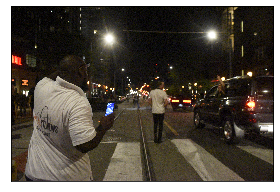


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170916_Trash_OL/20170916_Trash_OL_067.JPG
Classification for test image #201: [4685.580078125, -3603.005615234375, -768.4867553710938, 486.2783508300781, -547.22705078125, -107.04345703125, -100.52509307861328, -45.762481689453125]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170906_StephensSoccer_jd/20170906_StephensSoccer_JD_126.JPG
Classification for test image #202: [10415.5810546875, -245.42958068847656, -6933.06689453125, -81.01123046875, -2571.102783203125, -248.26998901367188, -232.58285522460938, -105.33675384521484]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170922_ToltonFNSfb_EJ/20170922_ToltonFNSfb_EJ224.JPG
Classification for test image #203: [9015.1220703125, -2743.24780273

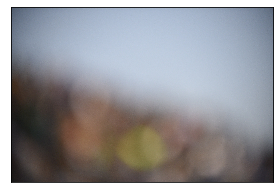


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171112_MUwrestling_JJ/20171112_MUwrestling_JJ_089.JPG
Classification for test image #221: [7351.0185546875, -248.69752502441406, -6189.564453125, 1576.18212890625, -1963.417236328125, -221.98617553710938, -208.28012084960938, -94.61660766601562]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171007_toltonsoftball_EJ/20171007_toltonsoftball_EJ_675.JPG
Classification for test image #222: [13013.6845703125, -3713.173095703125, -7777.45166015625, -39.36134338378906, -747.414794921875, -311.3106994628906, -292.488525390625, -132.2906951904297]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171007_toltonsoftball_EJ/20171007_toltonsoftball_EJ_938.JPG
Classification for test image #223: [5565.44

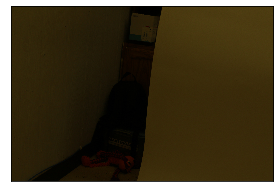


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20171001GourdWorkshop_jd/20171001_artworkshop_jd_070.JPG
Classification for test image #241: [5093.326171875, -753.6160888671875, -3409.529052734375, -1002.9996948242188, 389.64251708984375, -133.785888671875, -125.80010986328125, -56.947837829589844]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170908_BooneFootball_OL/20170908_BooneFootball_OL_391.JPG
Classification for test image #242: [15763.546875, -1653.0289306640625, -12097.2431640625, -2819.609375, 1540.096923828125, -310.02313232421875, -291.2506408691406, -132.03956604003906]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171101_PJP_Shoot1_EJ/20171101_PJP_Shoot1_EJ_069.JPG
Classification for test image #243: [9735.1748046875, -3744.34

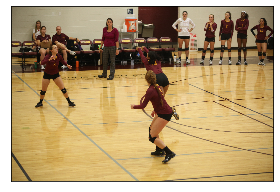


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171007_toltonsoftball_EJ/20171007_toltonsoftball_EJ_126.JPG
Classification for test image #261: [5491.310546875, -1618.15625, -702.8851318359375, -385.3429870605469, -2205.373046875, -245.61781311035156, -230.89295959472656, -104.67054748535156]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171110_bookmobile_JJ/2071110_bookmobile_JJ_054.JPG
Classification for test image #262: [2683.566650390625, 1062.8079833984375, -2541.01904296875, -1037.25537109375, 461.32012939453125, -265.37042236328125, -249.27769470214844, -112.73600769042969]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171027_BattleFB_FNS_EJ/20171027_BattleFB_FNS_EJ_330.JPG
Classification for test image #263: [10838.686523437

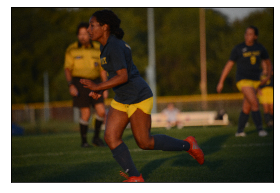


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170907_ShawnVeronika_OL/20170907_ShawnVeronica_OL_462.JPG
Classification for test image #281: [12083.8720703125, -2709.587890625, -5657.837890625, -2044.677978515625, -877.6097412109375, -335.1517639160156, -314.50714111328125, -142.45101928710938]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171113_InHomeImpact_EJ/20171113_InHomeImpact_EJ_160.JPG
Classification for test image #282: [8066.38671875, -2700.707275390625, -1095.1260986328125, -1728.4951171875, -1848.6185302734375, -292.8978271484375, -275.2362365722656, -124.94208526611328]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171102_VOXgrannybasketball_JJ/20171102_VOXgrannybasketball_JJ_042.JPG
Classification for test image #283: [

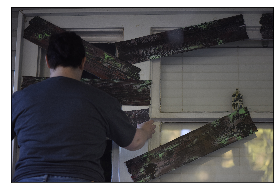


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170830_RockbridgeSoccer_jd/20170830_RockbridgeSoccer_jd_280.JPG
Classification for test image #301: [7741.6181640625, -569.4181518554688, -5602.30419921875, 2058.473388671875, -2934.5908203125, -293.8215637207031, -275.23291015625, -124.4606704711914]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170907_ShawnVeronika_OL/20170907_ShawnVeronica_OL_040.JPG
Classification for test image #302: [5745.78759765625, -825.69384765625, -4265.0078125, -559.3416137695312, 284.55340576171875, -160.56224060058594, -150.96539306640625, -68.2601318359375]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/zz_Mugs/20170820_MissourianMugs_WM_177.JPG
Classification for test image #303: [5671.25390625, -1357.1912841796875, -4057.4384

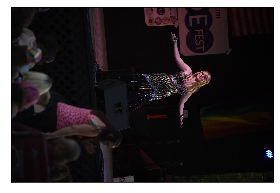


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170907_tomatofest_nc/20170907_tomatofestival_nc_371.JPG
Classification for test image #321: [7376.41650390625, -2722.904541015625, -1700.6236572265625, -1540.073974609375, -1082.56787109375, -140.09532165527344, -131.53761291503906, -59.90568542480469]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20171016_BroadwayBrewery_jd/20171016_BroadwayBrewery_jd_001.JPG
Classification for test image #322: [6434.869140625, 596.1912231445312, -3370.3388671875, -1769.0616455078125, -1156.364501953125, -310.87188720703125, -292.47705078125, -131.98902893066406]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170914_democracyplay_nc/20170914_democracyplay_nc_244.JPG
Classification for test image #323: [4366.2

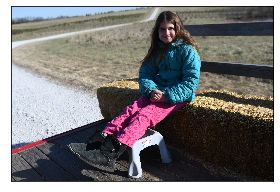


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170913_ShawnVeronika_OL/20170913_ShawnVeronika_OL_465.JPG
Classification for test image #341: [8664.7509765625, -1506.501220703125, -5120.67626953125, -689.9116821289062, -811.1226806640625, -225.98483276367188, -212.47381591796875, -96.46204376220703]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171009_VoxArtEatery_EJ/20171009_VoxArtEatery_EJ_409.JPG
Classification for test image #342: [9042.712890625, -2126.09765625, -4469.11572265625, -1447.4342041015625, -396.69647216796875, -254.1191864013672, -239.05865478515625, -107.99317169189453]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170929_fridaynightsights_nc/20170929_fridaynightsights_nc_165.JPG
Classification for test image #343: [630

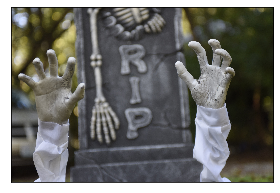


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171024_academyofrock_ec/20171024_academyofrock_ec_035.JPG
Classification for test image #361: [8967.8466796875, -4498.0859375, -866.5503540039062, -2587.462158203125, -120.64120483398438, -378.569091796875, -356.328125, -160.6787109375]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170909_BoonevilleFootball_ec/1070909_BoonevilleFootball_Ec_362.JPG
Classification for test image #362: [8342.779296875, 1909.535400390625, -9772.0263671875, 366.6298522949219, -380.34619140625, -197.50900268554688, -185.4207000732422, -84.09066009521484]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170927_tuckerbattle_JJ/20170927_tuckerbattle_JJ_080.JPG
Classification for test image #363: [10088.374

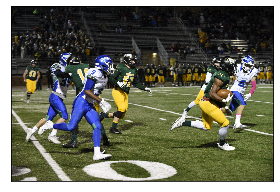


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171014tigerhacks_jj/20171014_tigerhacks_jj_185.JPG
Classification for test image #381: [5211.42578125, -1126.5919189453125, -3797.91455078125, -519.1039428710938, 1126.7891845703125, -378.1141662597656, -354.79241943359375, -160.84722900390625]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170824_stephenssoccer_NC/20170824_stephenssoccer_nc_348.JPG
Classification for test image #382: [13622.251953125, -2064.951416015625, -8146.63623046875, 962.5374145507812, -3826.90087890625, -231.05804443359375, -216.68844604492188, -98.15694427490234]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171208_carcrash_JJ/20171208_carcrash_JJ_028.JPG
Classification for test image #383: [957.037109375, 982.

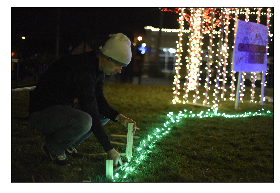


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171008_crushfestival_JJ/20171008_crushfestival_JJ_178.JPG
Classification for test image #401: [1510.74072265625, -373.3725891113281, -93.88594055175781, 1057.9287109375, -1620.9215087890625, -202.38099670410156, -190.30250549316406, -86.42723846435547]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171027_featuresheep_JJ/20171027_featuresheep_JJ_191.JPG
Classification for test image #402: [7982.67578125, -2313.714599609375, -2386.820068359375, -1434.4134521484375, -1314.659912109375, -225.0099334716797, -211.16632080078125, -95.69376373291016]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170828_FeatureLeeStreetDeli/20170828_FeatureLeeStreetDeli_EJ_220.JPG
Classification for test image

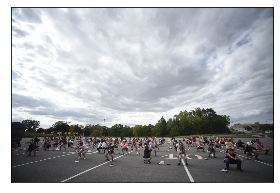


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171110_GirlsOnTheRun_EJ/20171111_GirlsOnTheRun_EJ_081.JPG
Classification for test image #421: [6148.19970703125, -414.16375732421875, -2874.89013671875, -1161.765869140625, -777.3886108398438, -389.2021179199219, -365.4537658691406, -165.144287109375]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170930_girlswhogame_JJ/20170930_girlswhogame_JJ_153.JPG
Classification for test image #422: [9155.150390625, -1556.9205322265625, -6720.9267578125, -210.88243103027344, 28.878524780273438, -293.9476013183594, -276.31591796875, -124.91997528076172]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170821_EclipseI70_EJ/20170821_EclipseI70_EJ_076.JPG
Classification for test image #423: [2181.56811523

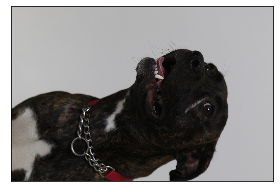


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171027_BattleFB_FNS_EJ/20171027_BattleFB_FNS_EJ_953.JPG
Classification for test image #441: [14431.9306640625, -1913.0096435546875, -10426.2451171875, -2705.387451171875, 1275.224609375, -280.1026306152344, -263.0084228515625, -119.4710464477539]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171027_BattleFB_FNS_EJ/20171027_BattleFB_FNS_EJ_587.JPG
Classification for test image #442: [10988.3037109375, -3135.442138671875, -4871.0654296875, -288.2309875488281, -1988.577880859375, -298.3494567871094, -279.963134765625, -126.49850463867188]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170824_MUfootballpractice_NC/20170824_mufootball_NC_056.JPG
Classification for test image #443: [13560.64648

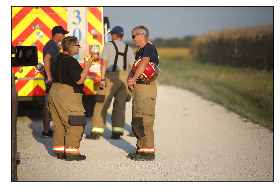


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170923_voxdesignerqa_nc/20170923_voxdesignerqa_nc_063.JPG
Classification for test image #461: [4050.73193359375, -786.859375, -2584.780517578125, -1548.85986328125, 1457.6575927734375, -249.03025817871094, -233.21327209472656, -105.92488861083984]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170824_stephenssoccer_NC/20170824_stephenssoccer_nc_397.JPG
Classification for test image #462: [12292.0126953125, -1966.6402587890625, -7188.15087890625, -485.53680419921875, -2207.853515625, -187.2982940673828, -175.7363739013672, -79.75909423828125]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170920_MUVolleyball_OL/20170920_MUVolleyball_OL_516.JPG
Classification for test image #463: [8701.704101562

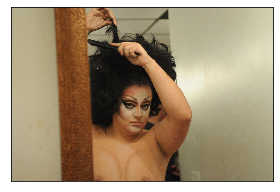


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171022_Voxcrockpot/20171022_voxcrockpot_JJ_082.JPG
Classification for test image #481: [4828.0556640625, -784.1376953125, -1153.5718994140625, -473.8472900390625, -2030.3167724609375, -162.9503631591797, -153.28366088867188, -69.25739288330078]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170930_storybookfarms_JJ/20170930_storybookfarms_JJ_168.JPG
Classification for test image #482: [1831.9947509765625, 327.13092041015625, 1720.363037109375, -1319.998291015625, -1943.07763671875, -260.7781677246094, -245.6605224609375, -110.88778686523438]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171213_SturgeonFire_EJ/20171213_SturgeonFire_EJ_026.JPG
Classification for test image #483: [2540.79

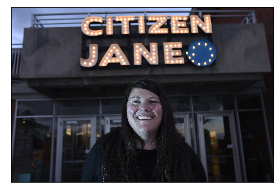


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20171002_visitingartist_nc/20171002_visitingartist_nc_041.JPG
Classification for test image #501: [1907.2554931640625, 1585.9534912109375, -3823.262451171875, -2509.562255859375, 3684.7109375, -356.7289733886719, -335.0772705078125, -151.63133239746094]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170829_ShermanHighway_ec/20170829_shermanhighway_ec_040.JPG
Classification for test image #502: [2603.915771484375, 1138.3984375, -1407.9586181640625, -1387.579833984375, -44.41560363769531, -381.3683166503906, -358.15692138671875, -161.94346618652344]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171008_crushfestival_JJ/20171008_crushfestival_JJ_496.JPG
Classification for test image #503: 

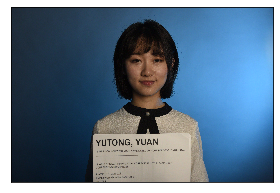


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170913_ShawnVeronika_OL/20170913_ShawnVeronika_OL_079.JPG
Classification for test image #521: [5226.44140625, 2478.1044921875, -7551.4833984375, 364.8368225097656, 113.48335266113281, -266.8542175292969, -250.4155731201172, -113.24398803710938]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171110_GirlsOnTheRun_EJ/20171111_GirlsOnTheRun_EJ_493.JPG
Classification for test image #522: [2839.647216796875, 1777.0899658203125, -3153.63818359375, -1110.4527587890625, 703.0967407226562, -446.9379577636719, -419.9708557128906, -189.89341735839844]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170830_Trump_EC/20170830_Trump_EC_551.JPG
Classification for test image #523: [130.07095336914062, -159

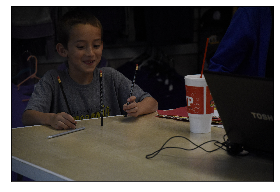


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170825_Rodeo_Ashland_ec/20170825_rodeo_EC_0865.JPG
Classification for test image #541: [-330.3097839355469, 2370.027587890625, 473.45367431640625, -2388.306884765625, 484.7120361328125, -257.43408203125, -241.9523162841797, -109.89836883544922]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170929_MUbbpress_JJ/20170928_mubbpress_JJ_447.JPG
Classification for test image #542: [10767.02734375, -2026.803466796875, -7443.31103515625, -982.053955078125, 359.23187255859375, -284.643310546875, -267.12554931640625, -121.26937103271484]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170918_Hickmansoccer_jd/20170918HickmanSoccer_jd_023.JPG
Classification for test image #543: [11189.9228515625, -

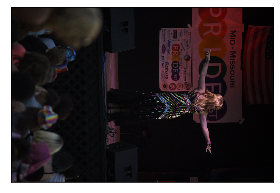


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170830_StephensSoccor_OL/20170830_StephensSoccer_OL_98.JPG
Classification for test image #561: [2751.998291015625, 642.3616943359375, -832.547119140625, 1228.1405029296875, -3117.27783203125, -284.8059387207031, -267.1314697265625, -120.74637603759766]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170826_PrideFest_OL/20170826_PrideFest_OL_404.JPG
Classification for test image #562: [7115.947265625, -1143.472900390625, -3831.86572265625, -1503.86767578125, 51.04646301269531, -290.64227294921875, -273.03033447265625, -123.8327865600586]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20171009_voxeateryart2_nc/20171009_voxeateryart2_nc_012.JPG
Classification for test image #563: [5656.5830078125, 499

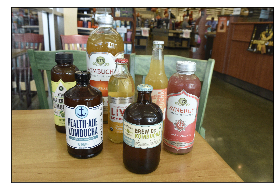


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170922_ToltonFNSfb_EJ/20170922_ToltonFNSfb_EJ669.JPG
Classification for test image #581: [9235.0185546875, -1987.7928466796875, -4831.49853515625, -320.69525146484375, -1648.4693603515625, -188.53363037109375, -177.1680145263672, -80.4896011352539]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171209_KwanzaaCelebration_EJ/20171209_KwanzaaCelebration_EJ_289.JPG
Classification for test image #582: [5624.2919921875, -1535.68359375, -4349.96435546875, -1139.220947265625, 1689.5802001953125, -121.7298355102539, -114.2380142211914, -51.988372802734375]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171101_VoxRadioArchives_EJ/20171101_VoxRadioArchive_EJ_270.JPG
Classification for test image #58

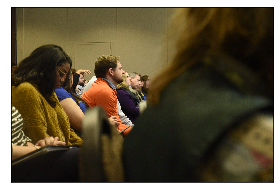


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170912_RockbridgeSoccer_ec/20170912_rockbridgesoccer_ec_004.JPG
Classification for test image #601: [7564.7373046875, 310.4273986816406, -8971.328125, 419.51416015625, 1030.686279296875, -149.899658203125, -140.32876586914062, -63.78404998779297]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170913_ShawnVeronika_OL/20170913_ShawnVeronika_OL_399.JPG
Classification for test image #602: [5623.328125, -1328.2833251953125, -2447.912109375, -754.577880859375, -552.2875366210938, -228.0693359375, -214.5882568359375, -97.01289367675781]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170912_RockbridgeSoccer_ec/20170912_rockbridgesoccer_ec_223.JPG
Classification for test image #603: [6574.040

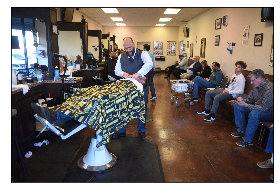


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170916_stlprotest2_Ec/2017091_stlprotest_ec_1556.JPG
Classification for test image #621: [2774.355224609375, 317.84149169921875, -2158.21044921875, 404.29388427734375, -812.7960205078125, -222.31961059570312, -209.31275939941406, -94.2326431274414]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170928_hallsvillecarnival_nc/20170928_hallsvillecarnival_nc_197.JPG
Classification for test image #622: [1948.8768310546875, 65.98887634277344, -1149.396728515625, 771.3944091796875, -1158.76220703125, -201.88204956054688, -190.2051544189453, -86.09517669677734]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170821_Eclipse_jd/20170821_Eclipse_CoopersLanding_jd_109.JPG
Classification for test image

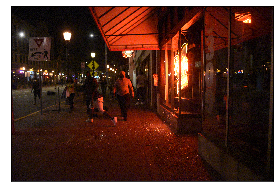


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170825_Rodeo_Ashland_ec/20170825_rodeo_EC_1183.JPG
Classification for test image #641: [-5379.458984375, 1668.5655517578125, 6230.29736328125, -1971.57373046875, 216.25149536132812, -323.1391906738281, -303.8917236328125, -137.74327087402344]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171210_starrpines_JJ/20171210_starrpines_JJ_096.JPG
Classification for test image #642: [3407.732421875, 765.5147094726562, -1964.824951171875, -1176.7508544921875, -397.9359130859375, -268.1939697265625, -251.4460906982422, -114.01162719726562]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170915_MUSoccer_OL/20170915_MUSoccer_OL_768.JPG
Classification for test image #643: [6878.51953125, 3209.2382812

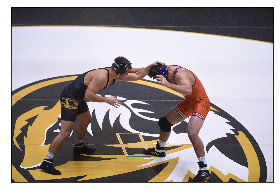


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171024_academyofrock_ec/20171024_academyofrock_ec_266.JPG
Classification for test image #661: [10988.9150390625, -3853.37548828125, -5342.29443359375, -919.8880615234375, -239.6844024658203, -267.4614562988281, -251.56015014648438, -113.50533294677734]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170918HickmanSoftball_jd/20170918HickmanSoftball_jd_142.JPG
Classification for test image #662: [14300.4423828125, -249.3741912841797, -11189.2705078125, -2159.254150390625, 179.24070739746094, -372.7516174316406, -350.2955627441406, -158.50274658203125]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20171130_muwomensbasketball_nc/20171130_muwomensbasketball_nc_149.JPG
Classification for test im

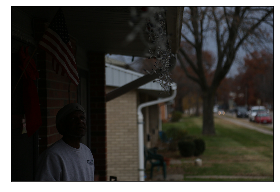


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170821_Eclipse_jd/20170821_Eclipse_CoopersLanding_jd_363.JPG
Classification for test image #681: [9938.9794921875, -1189.1287841796875, -7137.00439453125, 279.76043701171875, -1270.1131591796875, -262.9984130859375, -246.7783966064453, -111.82907104492188]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170824_stephenssoccer_NC/20170824_stephenssoccer_nc_319.JPG
Classification for test image #682: [13717.6220703125, -1523.19482421875, -9654.4931640625, 839.371826171875, -2792.01416015625, -247.9598388671875, -232.97752380371094, -105.52503204345703]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170910_steamengineshow_jj/20170910_steamengineshow_jj_366.JPG
Classification for test image #683:

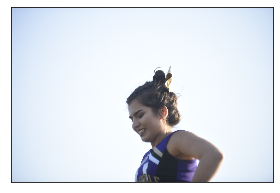


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171007_toltonsoftball_EJ/20171007_toltonsoftball_EJ_392.JPG
Classification for test image #701: [8454.697265625, 1692.964111328125, -4662.27294921875, -1925.656005859375, -2983.01171875, -243.37330627441406, -229.18096923828125, -103.66764831542969]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170922_ToltonFNSfb_EJ/20170922_ToltonFNSfb_EJ773.JPG
Classification for test image #702: [7168.89453125, -782.83447265625, -4494.9853515625, -26.66314697265625, -1461.834228515625, -169.854736328125, -159.6849365234375, -72.82730102539062]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170920_MUVolleyball_OL/20170920_MUVolleyball_OL_386.JPG
Classification for test image #703: [8946.1826171875, -1500.

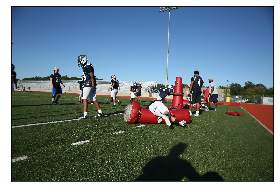


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171208_nicparksQ&A/20171208_nicparksq&a_JJ_011.JPG
Classification for test image #721: [5599.6923828125, -96.40160369873047, -5440.04248046875, -339.4002685546875, 735.2095336914062, -193.59600830078125, -182.2462158203125, -82.7223892211914]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170916_stlprotest2_Ec/2017091_stlprotest_ec_2322.JPG
Classification for test image #722: [5952.3505859375, -777.0702514648438, -2942.975341796875, -1955.8662109375, 236.29832458496094, -216.77239990234375, -204.44459533691406, -92.49899291992188]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171027_BattleFB_FNS_EJ/20171027_BattleFB_FNS_EJ_304.JPG
Classification for test image #723: [10377.172851562

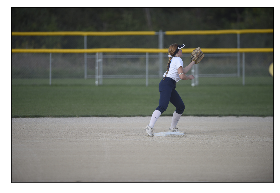


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170904_HeartofAmericaMarathon_EJ/20170904_HeartofAmericaMarathon_EJ_672.JPG
Classification for test image #741: [10508.6806640625, -689.7821655273438, -9172.634765625, 1204.37841796875, -1273.70068359375, -243.77117919921875, -229.22921752929688, -103.82855987548828]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171022_Voxcrockpot/20171022_voxcrockpot_JJ_047.JPG
Classification for test image #742: [7544.59765625, -923.3773193359375, -4910.25244140625, 57.16936492919922, -1123.2850341796875, -272.7480773925781, -255.95635986328125, -115.68758392333984]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170822_NAACPForum_EC/20170822_NAACPForum_EC_003.JPG
Classification for test image #743

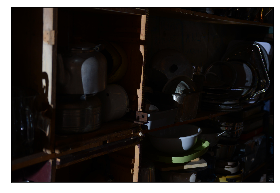


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170910_steamengineshow_jj/20170910_steamengineshow_jj_208.JPG
Classification for test image #761: [6105.0185546875, -754.880615234375, -3204.983642578125, -1306.19921875, -299.19268798828125, -227.89254760742188, -213.95703125, -96.78746795654297]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170904_HeartofAmericaMarathon_EJ/20170904_HeartofAmericaMarathon_EJ_817.JPG
Classification for test image #762: [7592.47412109375, -1449.45849609375, -4578.2880859375, 603.049072265625, -1616.7330322265625, -233.76524353027344, -219.16873168945312, -99.26852416992188]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170927_tuckerbattle_JJ/20170927_tuckerbattle_JJ_197.JPG
Classification for test imag

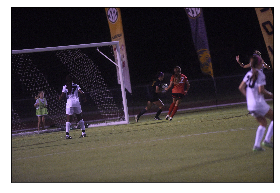


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170916_stlprotest2_Ec/2017091_stlprotest_ec_1486.JPG
Classification for test image #781: [9456.07421875, -733.299072265625, -5260.19970703125, -407.6818542480469, -2483.414306640625, -241.47640991210938, -226.88241577148438, -103.01370239257812]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170906_ToltonVolleyball_OL/20170906_ToltonVolleyball_OL_134.JPG
Classification for test image #782: [10815.6064453125, -1651.1893310546875, -4228.44091796875, -1420.845458984375, -2790.60791015625, -306.01214599609375, -287.2614440917969, -129.87240600585938]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170821_Eclipse_jd/20170821_Eclipse_CoopersLanding_jd_117.JPG
Classification for test image #783: [

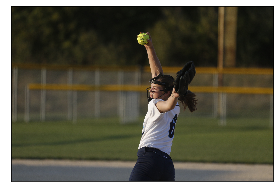


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171009_PaigeBedsworth_EJ/20171009_PaigeBedsworth_EJ_1194.JPG
Classification for test image #801: [5020.38525390625, -508.3246765136719, -3050.3359375, -592.218017578125, -595.848876953125, -115.55147552490234, -108.70672607421875, -49.226890563964844]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170922_ToltonFNSfb_EJ/20170922_ToltonFNSfb_EJ106.JPG
Classification for test image #802: [12422.9287109375, -2854.975830078125, -9335.0927734375, -137.62786865234375, 555.9088745117188, -274.88671875, -258.2039794921875, -117.5794677734375]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170911_Cartwright1on1_EJ/20170911_Cartwright1on1_EJ_080.JPG
Classification for test image #803: [7021.96435546

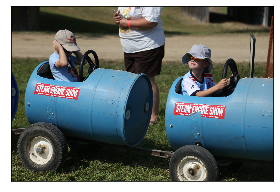


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170916_stlprotest2_Ec/2017091_stlprotest_ec_586.JPG
Classification for test image #821: [8111.021484375, -1507.4620361328125, -5621.1015625, -1346.491455078125, 931.8101806640625, -239.51490783691406, -225.2102813720703, -102.09980773925781]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171030_BoonePointApartments_EJ/20171030_BoonePointApartments_EJ_028.JPG
Classification for test image #822: [6956.92724609375, -1458.8050537109375, -4625.6416015625, -1764.257080078125, 1490.6439208984375, -253.3451690673828, -237.81289672851562, -107.35924530029297]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170922_ToltonFNSfb_EJ/20170922_ToltonFNSfb_EJ102.JPG
Classification for test image #823: 

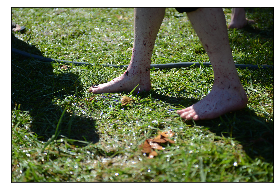


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170902_CCvolleyball_JJ/20170902_CCvolleyball_JJ_166.JPG
Classification for test image #841: [5347.70849609375, -309.4270324707031, -1897.2366943359375, -2702.186767578125, 331.7469482421875, -325.42254638671875, -306.185302734375, -138.4558868408203]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171203_nightbball_JJ/20171203_normstewartlate_JJ_229.JPG
Classification for test image #842: [13622.0263671875, -2065.1044921875, -11357.8408203125, -979.8267822265625, 1491.436279296875, -300.1231384277344, -281.9066162109375, -127.67681884765625]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171028_StephensCollegeSoccer_EJ/20171028_StephensCollegeSoccer_EJ_087.JPG
Classification for test ima

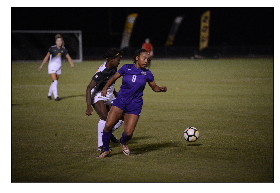


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171105_skeetshoot_JJ/20171105_skeetshooting_JJ146.JPG
Classification for test image #861: [7191.7109375, -2059.108154296875, -4257.65185546875, -576.5966796875, 3.4263916015625, -127.41692352294922, -119.71490478515625, -54.47157287597656]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170830_Trump_EC/20170830_Trump_EC_014.JPG
Classification for test image #862: [6991.97705078125, -295.4100341796875, -3932.56005859375, -1074.239501953125, -826.6729125976562, -364.4090270996094, -343.0720520019531, -155.08604431152344]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170828_featurehunt_nc/20170828_featurehunt_nc_011.JPG
Classification for test image #863: [2216.618408203125, -422.7065124

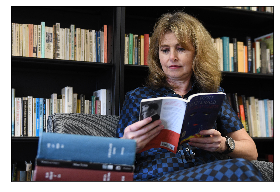


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171028_StephensCollegeSoccer_EJ/20171028_StephensCollegeSoccer_EJ_302.JPG
Classification for test image #881: [15879.05078125, -2765.54345703125, -5388.01171875, -1504.3165283203125, -5466.1396484375, -319.11456298828125, -299.51263427734375, -135.81124877929688]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170929_MUbbpress_JJ/20170928_mubbpress_JJ_585.JPG
Classification for test image #882: [4282.51904296875, 1453.7523193359375, -5163.92138671875, -61.370540618896484, -41.44031524658203, -198.06265258789062, -185.67120361328125, -84.02879333496094]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171211_VoxNiedermeyerBuilding_EJ/20171211_VoxNiedermeyerApartments_EJ_134.JPG
Classificatio

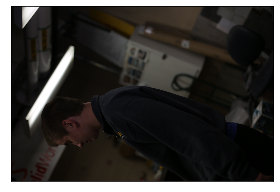


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171027_RockBridge_ec/20171027_rockbridge_Ec_0378.JPG
Classification for test image #901: [10639.5693359375, -448.71148681640625, -7887.76611328125, -1077.082763671875, -701.8306884765625, -220.89370727539062, -207.65072631835938, -94.2262191772461]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171007_toltonsoftball_EJ/20171007_toltonsoftball_EJ_953.JPG
Classification for test image #902: [1929.9383544921875, 361.3059387207031, 900.3906860351562, -1774.199951171875, -836.07373046875, -245.7227783203125, -231.27261352539062, -104.55655670166016]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170825_Rodeo_Ashland_ec/20170825_rodeo_EC_0720.JPG
Classification for test image #903: [-69

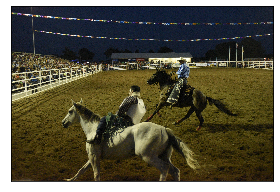


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171008_crushfestival_JJ/20171008_crushfestival_JJ_006.JPG
Classification for test image #921: [7883.328125, -2129.7744140625, -2854.807373046875, -591.8177490234375, -1988.5228271484375, -133.930908203125, -126.31300354003906, -57.33598327636719]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171107_honorflight_ec/20171107_honorflight_ec_004.JPG
Classification for test image #922: [-2235.474609375, 2134.929931640625, 458.98095703125, 372.3111572265625, -232.62957763671875, -210.54251098632812, -198.1516571044922, -89.54975891113281]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20171023_Citizenjane_nc/20171023_citizenjane_nc_019.JPG
Classification for test image #923: [3531.94995117187

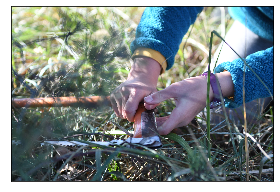


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20171023_HickmanSoccerTourn_jd/20171023_HickmanSoccer_JD_099.JPG
Classification for test image #941: [9500.30078125, -848.6302490234375, -5555.0302734375, -1167.943359375, -1606.741455078125, -136.12673950195312, -128.494873046875, -57.92601013183594]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170826_PrideFest_OL/20170826_PrideFest_OL_1043.JPG
Classification for test image #942: [5562.88671875, -837.3765869140625, -2582.1015625, -2206.706298828125, 492.37701416015625, -181.81411743164062, -171.9180145263672, -77.33015441894531]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171108_PoachingStory_EJ/20171108_PoachingStory_EJ_223.JPG
Classification for test image #943: [2109.718017578125, 628.6

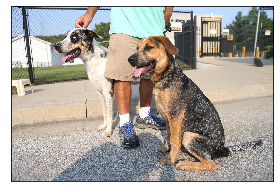


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171207_rbhoops_ec/20171207_rbhoops_ec_014.JPG
Classification for test image #961: [6244.87890625, 58.54741287231445, -4940.53271484375, 385.4745788574219, -1322.49609375, -179.39208984375, -168.92056274414062, -76.54229736328125]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170920_MUVolleyball_OL/20170920_MUVolleyball_OL_261.JPG
Classification for test image #962: [4497.48486328125, 4734.806640625, -7502.0341796875, 1840.492431640625, -2758.345947265625, -342.8340759277344, -322.88116455078125, -146.21363830566406]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170826_PrideFest_OL/20170826_PrideFest_OL_251.JPG
Classification for test image #963: [6665.16796875, 314.42266845703125, -4570.6

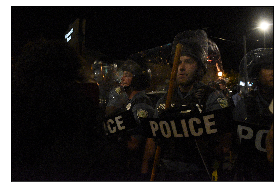


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171007_toltonsoftball_EJ/20171007_toltonsoftball_EJ_950.JPG
Classification for test image #981: [799.0250244140625, -1286.6141357421875, -320.127197265625, 2498.7958984375, -1123.81494140625, -240.43814086914062, -225.9513397216797, -102.47441101074219]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170917_boonevilleservice_JJ/20170917_boonvilleservice_JJ_375.JPG
Classification for test image #982: [6360.7705078125, -596.883544921875, -2737.896240234375, -1510.5673828125, -905.2681884765625, -257.7608947753906, -242.52297973632812, -109.85123443603516]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171022_Voxcrockpot/20171022_voxcrockpot_JJ_062.JPG
Classification for test image #983: [5

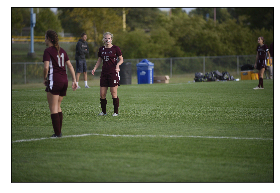


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170901_musoc_ec/20170901_musoc_Ec_419.JPG
Classification for test image #1001: [2790.932861328125, 1785.4346923828125, -425.10693359375, 517.6837768554688, -4074.101806640625, -251.82772827148438, -236.03350830078125, -107.1229476928711]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170906_ToltonVolleyball_OL/20170906_ToltonVolleyball_OL_579.JPG
Classification for test image #1002: [10585.9619140625, -832.9063110351562, -7531.80322265625, -1021.587646484375, -557.8248901367188, -270.86456298828125, -254.46563720703125, -114.9279556274414]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171009_PaigeBedsworth_EJ/20171009_PaigeBedsworth_EJ_853.JPG
Classification for test image #1003: [6294.

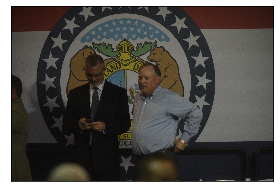


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170904_HickmanSoccer_jd/20170906_HickmanSoccer_JD_050.JPG
Classification for test image #1021: [13452.4619140625, 1333.913330078125, -10957.650390625, -1207.546142578125, -2170.16162109375, -191.52545166015625, -179.94346618652344, -81.26655578613281]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171116_muwbb_Ec/20171116_muwbb_ec_544.JPG
Classification for test image #1022: [9158.3798828125, -3459.065185546875, -2971.0283203125, -3080.679931640625, 1790.91064453125, -607.6324462890625, -570.7095336914062, -259.3905944824219]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171025_Rockclimbing_ec/20171025_rockclimbing_372.JPG
Classification for test image #1023: [6511.91796875, -22.96

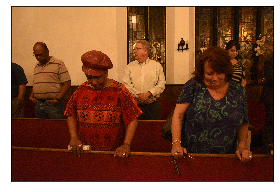


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170826_PrideFest_OL/20170826_PrideFest_OL_944.JPG
Classification for test image #1041: [3640.860107421875, 756.2586669921875, -2202.70068359375, -1873.24072265625, 127.80561828613281, -189.76083374023438, -178.3394775390625, -80.53263092041016]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171009_PaigeBedsworth_EJ/20171009_PaigeBedsworth_EJ_185.JPG
Classification for test image #1042: [4639.08203125, -626.51513671875, -1561.2996826171875, -787.0158081054688, -1364.638671875, -126.45426940917969, -118.78899383544922, -53.6973876953125]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170922_battlefootball_Ec/20170922_fridaynightsights_ec_253.JPG
Classification for test image #1043: [19115.

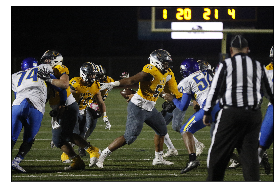


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171209_KwanzaaCelebration_EJ/20171209_KwanzaaCelebration_EJ_260.JPG
Classification for test image #1061: [6897.82568359375, 217.54490661621094, -5520.0283203125, -2473.46240234375, 1229.780517578125, -148.35203552246094, -139.5229034423828, -63.276634216308594]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170920_toltongolf_EJ/20170920_toltongolf_EJ_028.JPG
Classification for test image #1062: [6460.3935546875, 2231.771240234375, -8133.6845703125, 16.54986572265625, -220.2781219482422, -150.2603759765625, -141.31411743164062, -63.628936767578125]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171009_PaigeBedsworth_EJ/20171009_PaigeBedsworth_EJ_394.JPG
Classification for test image #1063:

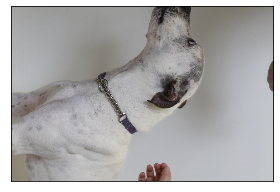


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170825_Rodeo_Ashland_ec/20170825_rodeo_EC_0266.JPG
Classification for test image #1081: [605.462646484375, -192.8578338623047, -749.6118774414062, -2789.527587890625, 3929.961669921875, -340.38470458984375, -319.6260986328125, -145.01710510253906]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171108_PoachingStory_EJ/20171108_PoachingStory_EJ_194.JPG
Classification for test image #1082: [7426.6201171875, -488.133544921875, -6674.95654296875, -818.9139404296875, 901.0641479492188, -145.74771118164062, -136.9722137451172, -62.29186248779297]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170823_BattleSoftball_OL/20170823_Battlesoftball_OL_437.JPG
Classification for test image #1083: [4980.

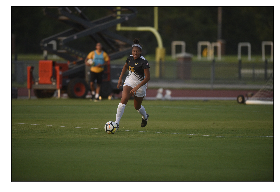


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171027_RockBridge_ec/20171027_rockbridge_Ec_0489.JPG
Classification for test image #1101: [16006.4189453125, -1468.4478759765625, -13178.2666015625, 214.77474975585938, -961.9072265625, -259.38018798828125, -244.1435089111328, -110.33031463623047]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170916_stlprotest2_Ec/2017091_stlprotest_ec_2261.JPG
Classification for test image #1102: [11701.3291015625, -2542.947021484375, -6947.33447265625, -1381.40625, -292.92486572265625, -226.79232788085938, -213.20425415039062, -96.21916961669922]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170922_battlefootball_Ec/20170922_fridaynightsights_ec_247.JPG
Classification for test image #1103:

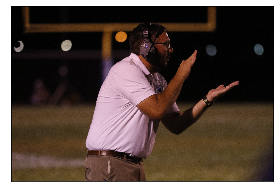


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170910_defenddaca_JJ/20170910_defenddaca_jj_069.JPG
Classification for test image #1121: [6314.384765625, -342.196044921875, -5574.66162109375, 2019.971435546875, -2037.302978515625, -160.64520263671875, -151.30545043945312, -68.49633026123047]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170909_BoonevilleFootball_ec/1070909_BoonevilleFootball_Ec_251.JPG
Classification for test image #1122: [9969.4921875, -81.51258850097656, -10086.46484375, 1368.62939453125, -398.90496826171875, -325.4101867675781, -306.1305236816406, -138.45021057128906]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170830_Trump_EC/20170830_Trump_EC_798.JPG
Classification for test image #1123: [1670.88415527

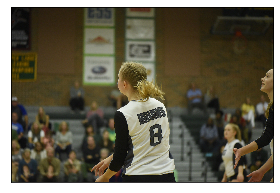


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170906_StephensSoccer_jd/20170906_StephensSoccer_JD_187.JPG
Classification for test image #1141: [13886.84765625, 1026.329833984375, -9863.0263671875, 58.249267578125, -4419.09375, -291.6955261230469, -273.4548645019531, -123.3776626586914]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171024_academyofrock_ec/20171024_academyofrock_ec_293.JPG
Classification for test image #1142: [8481.349609375, -2830.220947265625, -3049.67919921875, -2869.894287109375, 722.6920166015625, -191.70449829101562, -180.53713989257812, -81.41981506347656]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170907_ShawnVeronika_OL/20170907_ShawnVeronica_OL_281.JPG
Classification for test image #1143: [3406.1848144531

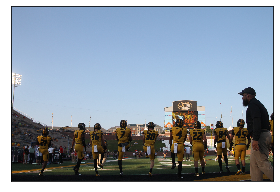


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171116_muwbb_Ec/20171116_muwbb_ec_397.JPG
Classification for test image #1161: [7029.50244140625, -166.5171661376953, -6013.44775390625, -1350.047119140625, 1050.2725830078125, -231.36328125, -217.757568359375, -98.43453216552734]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170826_PetExpo_OL/20170826_PetExpo_OL_131.JPG
Classification for test image #1162: [3302.329345703125, 2068.006591796875, -3257.915283203125, 46.1754150390625, -1524.30029296875, -268.7695617675781, -252.08956909179688, -114.13021087646484]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170823_gradrally_EJ/20170823_gradrally_EJ1103.JPG
Classification for test image #1163: [3293.356689453125, -1011.547607421875, -84

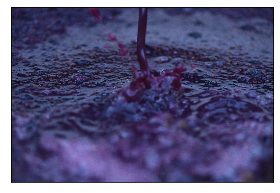


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170830_RockbridgeSoccer_jd/20170830_RockbridgeSoccer_jd_144.JPG
Classification for test image #1181: [9432.5859375, 1399.9384765625, -7863.51708984375, 518.760498046875, -3075.7900390625, -174.68325805664062, -163.951171875, -73.81371307373047]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170830_StephensSoccor_OL/20170830_StephensSoccer_OL_773.JPG
Classification for test image #1182: [9275.9921875, 1475.7921142578125, -8607.2333984375, 1408.79052734375, -2881.2763671875, -284.56329345703125, -267.083740234375, -120.59620666503906]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170915_MUSoccer_OL/20170915_MUSoccer_OL_499.JPG
Classification for test image #1183: [13215.166015625, -1030.7158203125

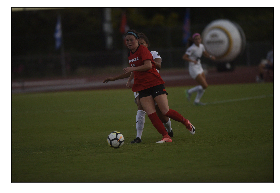


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170825_BattleFootball_OL/08252017_BattleFootball_OL_603.JPG
Classification for test image #1201: [20321.873046875, -2469.889404296875, -16081.2783203125, -398.2668762207031, -724.6015625, -273.8296813964844, -257.2138366699219, -116.8954086303711]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171025_Rockclimbing_ec/20171025_rockclimbing_023.JPG
Classification for test image #1202: [4022.697021484375, -227.59547424316406, -1292.097900390625, 112.30327606201172, -2203.834228515625, -174.38804626464844, -164.0218963623047, -74.3745346069336]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171117_Hartzlertax_JJ/20171117_Hartzlertax_JJ_142.JPG
Classification for test image #1203: [4130.89550

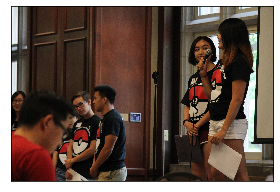


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170830_HickmanFBPractice_EJ/20170830_HickmanFBPractice_EJ_242.JPG
Classification for test image #1221: [8731.568359375, -710.6843872070312, -6155.17431640625, 666.1122436523438, -2186.310791015625, -146.27017211914062, -136.869384765625, -61.98759460449219]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170906_ToltonVolleyball_OL/20170906_ToltonVolleyball_OL_762.JPG
Classification for test image #1222: [9346.265625, -441.8436279296875, -4540.11279296875, -1279.474853515625, -2254.218994140625, -351.0735168457031, -329.6575622558594, -149.04856872558594]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171027_featuresheep_JJ/20171027_featuresheep_JJ_104.JPG
Classification for test image #1223:

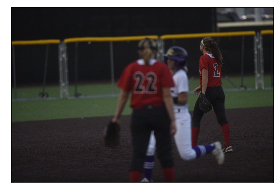


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20171011_Vox_BeerStudio_jd/20171011_Voxbeer_jd_226.JPG
Classification for test image #1241: [10500.0830078125, -1471.3753662109375, -5225.80029296875, -1783.9508056640625, -1296.1151123046875, -304.6974792480469, -286.23236083984375, -130.01113891601562]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171028_StephensCollegeSoccer_EJ/20171028_StephensCollegeSoccer_EJ_120.JPG
Classification for test image #1242: [4748.15869140625, -638.0753173828125, -24.28685188293457, -810.0550537109375, -2959.62255859375, -133.11865234375, -125.52299499511719, -56.60700988769531]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171107_honorflight_ec/20171107_honorflight_ec_228.JPG
Classification for test im

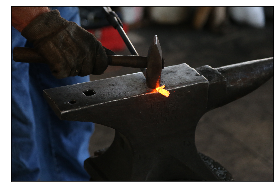


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171129_VoxWorkoutMusic_EJ/20171129_VoxExerciseMusic_EJ_118.JPG
Classification for test image #1261: [12351.2509765625, 1885.0584716796875, -10460.7041015625, -679.9523315429688, -2582.779541015625, -216.87753295898438, -203.31349182128906, -91.33341217041016]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170827_Firstpresprayer_JJ/20170827_Firstpresprayer_JJ_031.JPG
Classification for test image #1262: [8876.6787109375, -894.9510498046875, -4028.736572265625, -1228.793701171875, -2114.703857421875, -257.32666015625, -242.2073516845703, -109.00838470458984]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170828_FeatureLeeStreetDeli/20170828_FeatureLeeStreetDeli_EJ_052.JPG
Classification fo

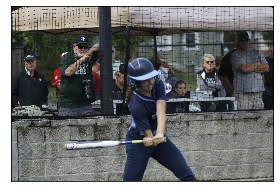


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170916_stlprotest2_Ec/2017091_stlprotest_ec_1824.JPG
Classification for test image #1281: [5243.435546875, -1216.3883056640625, 1485.6812744140625, -1792.3359375, -2834.50048828125, -374.658447265625, -352.6458435058594, -159.23118591308594]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20171014_StableTour_jd/20171014_stabletour_JD_068.JPG
Classification for test image #1282: [8802.3056640625, 2945.3369140625, -10286.4736328125, -846.2017211914062, 329.818603515625, -400.1911315917969, -376.21917724609375, -170.15745544433594]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170907_tomatofest_nc/20170907_tomatofestival_nc_212.JPG
Classification for test image #1283: [8834.203125, -1708.9121

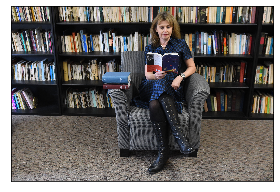


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170830_Trump_EC/20170830_Trump_EC_163.JPG
Classification for test image #1301: [4651.09033203125, -1053.6209716796875, 321.118896484375, -2178.2275390625, -851.9267578125, -375.2669372558594, -353.1378173828125, -159.67630004882812]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170907_ShawnVeronika_OL/20170907_ShawnVeronica_OL_993.JPG
Classification for test image #1302: [7341.4775390625, -1769.9521484375, -3032.691162109375, -977.8316650390625, -825.2092895507812, -310.8962707519531, -291.87017822265625, -132.40916442871094]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170825_Pitbulls_EJ/20170825_voxPitbulls_EJ_076.JPG
Classification for test image #1303: [2380.66162109375, 661.24340

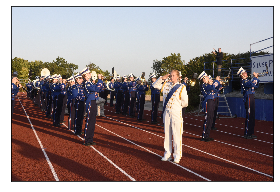


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170904_HickmanSoccer_jd/20170906_HickmanSoccer_JD_189.JPG
Classification for test image #1321: [10127.2880859375, -221.0196075439453, -6079.51806640625, -553.29833984375, -2704.38037109375, -240.61520385742188, -225.73129272460938, -101.95752716064453]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171025_Rockclimbing_ec/20171025_rockclimbing_136.JPG
Classification for test image #1322: [11729.1064453125, -4453.751953125, -4062.289306640625, -596.5685424804688, -1763.4134521484375, -360.3253479003906, -339.062744140625, -153.65760803222656]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171027_BattleFB_FNS_EJ/20171027_BattleFB_FNS_EJ_881.JPG
Classification for test image #1323: [6984.82

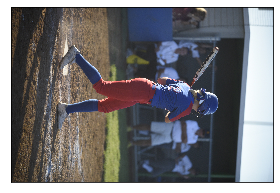


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171126_kerripolicy_JJ/20171126_kerripolicy_JJ_088.JPG
Classification for test image #1341: [4417.5869140625, -2994.793701171875, -257.5002746582031, -845.51416015625, 96.22708129882812, -175.978515625, -165.25392150878906, -74.49837493896484]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170823_gradrally_EJ/20170823_gradrally_EJ1132.JPG
Classification for test image #1342: [10065.66796875, -4132.1328125, -3878.451171875, -278.4815368652344, -545.822998046875, -520.7335205078125, -489.5253601074219, -220.67201232910156]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170929_MUbbpress_JJ/20170928_mubbpress_JJ_307.JPG
Classification for test image #1343: [8798.0595703125, -2035.60925292968

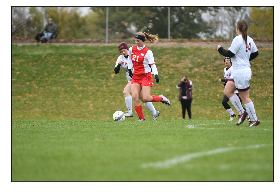


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171129_TaxProtest_EJ/20171129_TaxProtest_EJ_166.JPG
Classification for test image #1361: [-1385.70068359375, 2257.236083984375, 1967.82763671875, -3358.56494140625, 1637.80859375, -472.7898254394531, -443.7436218261719, -200.93482971191406]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171013_helicoptertraining_JJ/20171013_helicoptertraining_JJ_202.JPG
Classification for test image #1362: [5434.580078125, -1024.5877685546875, -5604.62060546875, -1149.87060546875, 2612.8193359375, -113.24126434326172, -106.46002197265625, -48.34398651123047]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171002_toltonsoftball_EJ/20171002_toltonsoftball_EJ_916.JPG
Classification for test image #1363: [993

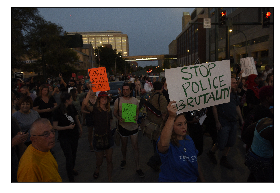


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170825_Rodeo_Ashland_ec/20170825_rodeo_EC_1001.JPG
Classification for test image #1381: [-4665.7607421875, 2419.952880859375, 4913.21044921875, -2093.56591796875, 50.78082275390625, -263.8028869628906, -247.86997985839844, -112.36341094970703]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170916_Tailgate_OL/20170916_Tailgating_OL_096.JPG
Classification for test image #1382: [5421.8076171875, 125.53559875488281, -3462.15966796875, -1548.8525390625, 192.14234924316406, -307.8899841308594, -289.27685546875, -131.18150329589844]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171009_PaigeBedsworth_EJ/20171009_PaigeBedsworth_EJ_567.JPG
Classification for test image #1383: [7589.34375, -636.96

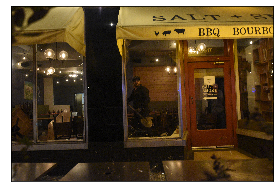


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170822_eclipse_jj/20170821_Eclipse_JJ_075.JPG
Classification for test image #1401: [2933.318115234375, -297.48291015625, -439.5382080078125, -776.637939453125, -832.6406860351562, -248.17465209960938, -233.37611389160156, -105.87014770507812]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/zz_Mugs/20170820_MissourianMugs_WM_091.JPG
Classification for test image #1402: [3765.3525390625, -83.22645568847656, -3497.06396484375, -834.258056640625, 1155.81103515625, -214.04379272460938, -201.01220703125, -91.24916076660156]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171014hickmansoccer/20171014_hickmansoccer_jj_035.JPG
Classification for test image #1403: [6430.326171875, -1264.7154541015625, -4008.5063476

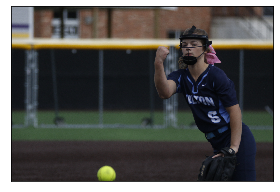


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170921_hickmanvolleyball_nc/20170921_hickmanvolleyball_nc_065.JPG
Classification for test image #1421: [10704.013671875, 1435.586669921875, -6884.74853515625, -2009.37353515625, -2324.778564453125, -389.5467834472656, -365.29852294921875, -165.42832946777344]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20171109_alternativestoopioids_nc/20171109_alternativestoopioids_nc_033.JPG
Classification for test image #1422: [6958.904296875, 339.0505065917969, -5705.7353515625, 560.0778198242188, -1476.3741455078125, -285.5439758300781, -268.6257019042969, -121.5278091430664]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170830_StephensSoccor_OL/20170830_StephensSoccer_OL_668.JPG
Classification for test

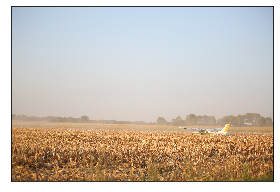


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171025_Rockclimbing_ec/20171025_rockclimbing_086.JPG
Classification for test image #1441: [4745.72412109375, -1115.48193359375, -2607.006591796875, -982.2979736328125, 491.6800537109375, -225.2084197998047, -211.6061248779297, -95.94154357910156]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171008_crushfestival_JJ/20171008_crushfestival_JJ_262.JPG
Classification for test image #1442: [7781.57763671875, -2084.73828125, -3886.85693359375, -155.931884765625, -1403.09716796875, -105.46319580078125, -99.45671844482422, -45.22063446044922]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170825_BattleFootball_OL/08252017_BattleFootball_OL_1156.JPG
Classification for test image #1443: [14132.6

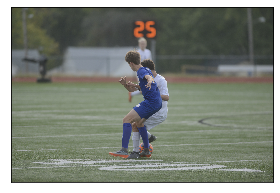


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171203_nightbball_JJ/20171203_normstewartlate_JJ_366.JPG
Classification for test image #1461: [5132.69189453125, -1590.2088623046875, -1055.0673828125, -1564.3543701171875, -282.5924072265625, -269.7626647949219, -253.69387817382812, -115.15336608886719]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20171102_mizzoudiwalicelebration_nc/20171102_mizzoudiwalicelebration_nc_174.JPG
Classification for test image #1462: [5730.0400390625, 644.7206420898438, -4580.662109375, 1212.37451171875, -2531.583740234375, -199.2735137939453, -188.09771728515625, -85.0595474243164]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170825_Rodeo_Ashland_ec/20170825_rodeo_EC_0299.JPG
Classification for test im

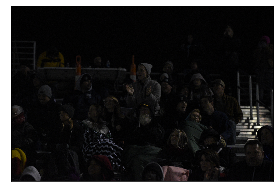


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170825_BattleFootball_OL/08252017_BattleFootball_OL_870.JPG
Classification for test image #1481: [14334.298828125, -1470.808837890625, -10206.560546875, -784.0572509765625, -1425.7044677734375, -189.28451538085938, -177.42550659179688, -80.3301773071289]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171024_academyofrock_ec/20171024_academyofrock_ec_147.JPG
Classification for test image #1482: [4619.52294921875, -1074.4078369140625, -1952.661865234375, -1107.2421875, 156.68544006347656, -271.10760498046875, -254.97210693359375, -115.21592712402344]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171027_BattleFB_FNS_EJ/20171027_BattleFB_FNS_EJ_418.JPG
Classification for test image #1483: [

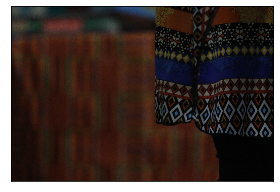


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170901_BattleRockbridgeFootball_OL/20170901_BattleRockbridgeFootball_OL_548.JPG
Classification for test image #1501: [9829.30859375, 1121.5789794921875, -8720.8759765625, 142.45303344726562, -1734.252685546875, -269.31524658203125, -253.56285095214844, -114.63505554199219]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170916_tailgate_ec/20170916_tailgate_ec_046.JPG
Classification for test image #1502: [4433.248046875, -735.91259765625, -1818.666015625, -110.56379699707031, -1252.878173828125, -217.44833374023438, -204.512451171875, -92.64868927001953]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170830_HickmanFBPractice_EJ/20170830_HickmanFBPractice_EJ_694.JPG
Classification for test 

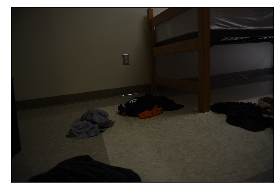


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170905_BattleTennisGirls_ec/20170905_battletennis_ec_129.JPG
Classification for test image #1521: [10585.5693359375, 653.542724609375, -7317.85400390625, -1314.5909423828125, -1830.32666015625, -328.7720642089844, -308.49285888671875, -140.0398406982422]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170916_stlprotest2_Ec/2017091_stlprotest_ec_443.JPG
Classification for test image #1522: [8724.8564453125, -1041.44091796875, -3992.32421875, -1540.760986328125, -1404.041748046875, -315.3329772949219, -296.0484313964844, -133.6968536376953]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20171016_featurehuntbindersschisler_nc/20171016_featurehuntbinderschisler_nc_015.JPG
Classification f

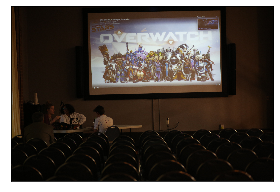


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171014hickmansoccer/20171014_hickmansoccer_jj_068.JPG
Classification for test image #1541: [11141.3671875, -2359.339111328125, -3168.22607421875, -901.0787353515625, -4212.75537109375, -211.40521240234375, -198.58538818359375, -90.00969696044922]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170825_Rodeo_Ashland_ec/20170825_rodeo_EC_0059.JPG
Classification for test image #1542: [2932.750732421875, 2791.360595703125, -1031.4859619140625, -2980.945068359375, -890.25830078125, -346.9158020019531, -326.2568054199219, -147.36781311035156]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170915_MUSoccer_OL/20170915_MUSoccer_OL_447.JPG
Classification for test image #1543: [6588.06494140625, 396

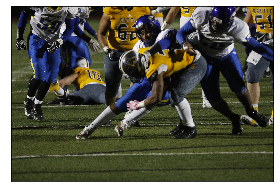


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171206_VoxQAStephenGraves_EJ/20171206_VoxQAStephenGraves_EJ_105.JPG
Classification for test image #1561: [4670.90869140625, -3151.171875, -1154.8931884765625, -1017.7715454101562, 1222.7705078125, -240.44886779785156, -225.83668518066406, -102.09516906738281]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171007_toltonsoftball_EJ/20171007_toltonsoftball_EJ_218.JPG
Classification for test image #1562: [8351.7041015625, -504.55718994140625, -6984.45068359375, 475.32421875, -921.2783813476562, -175.72088623046875, -164.74813842773438, -74.8354263305664]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170906_ToltonFootballPractice_OL/20170906_ToltonFootballPractice_OL_203.JPG
Classification for t

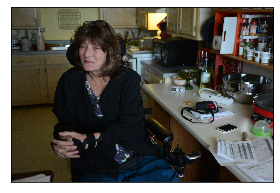


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170823_BattleSoftball_OL/20170823_Battlesoftball_OL_009.JPG
Classification for test image #1581: [5752.49267578125, -1714.819580078125, -3663.44482421875, 511.52337646484375, -139.47921752929688, -315.6865234375, -296.31317138671875, -134.34951782226562]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170826_PrideFest_OL/20170826_PrideFest_OL_831.JPG
Classification for test image #1582: [8816.3515625, -1492.4320068359375, -4813.04052734375, -1434.2242431640625, -349.2928466796875, -307.42791748046875, -289.5031433105469, -130.3723602294922]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170901_musoc_ec/20170901_musoc_Ec_069.JPG
Classification for test image #1583: [8322.0927734375, 1373.7219

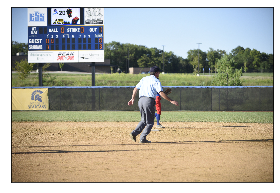


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171024_academyofrock_ec/20171024_academyofrock_ec_004.JPG
Classification for test image #1601: [3360.232177734375, 85.89488220214844, -1756.8992919921875, -499.4226379394531, -528.7991943359375, -279.1774597167969, -262.23382568359375, -118.57122039794922]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170901_BattleRockbridgeFootball_OL/20170901_BattleRockbridgeFootball_OL_065.JPG
Classification for test image #1602: [14709.658203125, -387.13092041015625, -14865.0048828125, 586.6779174804688, 582.0126953125, -265.2792663574219, -249.3028106689453, -113.25226593017578]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170905_PouchPool_ec/20170905_poochplunge_EC_713.JPG
Classification for

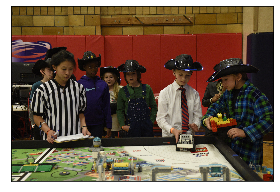


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170920_MUVolleyball_OL/20170920_MUVolleyball_OL_495.JPG
Classification for test image #1621: [3639.34912109375, 2836.074951171875, -4229.89794921875, -1436.7802734375, -116.80963134765625, -292.40692138671875, -274.98944091796875, -124.34598541259766]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171002_toltonsoftball_EJ/20171002_toltonsoftball_EJ_809.JPG
Classification for test image #1622: [3840.468505859375, 3871.227783203125, -4650.29638671875, 786.33740234375, -2905.623779296875, -398.7818908691406, -374.71929931640625, -168.8780059814453]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170909_BoonevilleFootball_ec/1070909_BoonevilleFootball_Ec_347.JPG
Classification for test image 

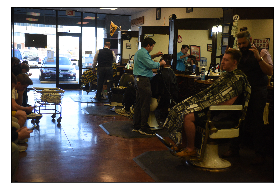


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170908_BooneFootball_OL/20170908_BooneFootball_OL_405.JPG
Classification for test image #1641: [13773.9130859375, -3710.003662109375, -9458.998046875, 23.0816650390625, -33.93867492675781, -251.77394104003906, -235.79483032226562, -106.42023468017578]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171031_BruceWallace_ec/20171031_BruceWallace_ec_137.JPG
Classification for test image #1642: [1821.8529052734375, 1089.1180419921875, -1294.0673828125, -1149.023681640625, -95.54740905761719, -157.4471435546875, -147.60671997070312, -67.15381622314453]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170826_PetExpo_OL/20170826_PetExpo_OL_167.JPG
Classification for test image #1643: [2535.28393554687

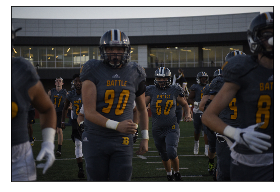


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170825_Rodeo_Ashland_ec/20170825_rodeo_EC_1188.JPG
Classification for test image #1661: [-1173.5479736328125, -274.7156982421875, 3257.459228515625, -1756.341796875, 453.58642578125, -213.9251708984375, -201.20846557617188, -91.43711853027344]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170825_BattleFootball_OL/08252017_BattleFootball_OL_211.JPG
Classification for test image #1662: [13018.0439453125, -1530.0731201171875, -7886.64990234375, -1946.125732421875, -1158.0233154296875, -209.89125061035156, -197.3173828125, -89.69746398925781]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170823_BattleHSFootballPractice_jd/20170823_BattlefootballPractice_jd_0140.JPG
Classification for test im

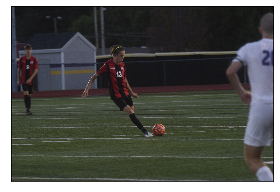


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170908_featurehunt_JJ/20170908_featurehunt_jj_128.JPG
Classification for test image #1681: [12475.2255859375, -3429.3271484375, -9685.8447265625, 1681.793701171875, -268.32867431640625, -328.0158386230469, -307.75244140625, -139.0831298828125]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170919_rbvolleyball_ec/20170919_rbvolleyball_Ec_ 558.JPG
Classification for test image #1682: [13277.8974609375, -1151.9859619140625, -10817.146484375, 842.3360595703125, -1590.657958984375, -236.57275390625, -221.86166381835938, -100.10447692871094]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170922_ToltonFNSfb_EJ/20170922_ToltonFNSfb_EJ528.JPG
Classification for test image #1683: [12240.136718

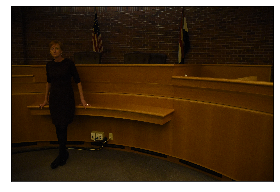


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170922_RockBridgeFootball_OL/20170922_RockbridgeFootball_OL_081.JPG
Classification for test image #1701: [12500.615234375, -1848.3472900390625, -10764.6376953125, 959.982421875, -282.04150390625, -239.4248046875, -225.09925842285156, -102.1783676147461]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170908_featurehunt_JJ/20170908_featurehunt_jj_027.JPG
Classification for test image #1702: [11006.50390625, 178.3247528076172, -8578.7255859375, -943.1890869140625, -1195.01513671875, -197.37869262695312, -185.44888305664062, -84.15327453613281]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170825_BattleFootball_OL/08252017_BattleFootball_OL_1181.JPG
Classification for test image #1703: [2667.2658

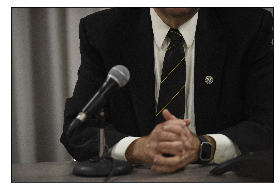


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170826_PrideFest_OL/20170826_PrideFest_OL_888.JPG
Classification for test image #1721: [5437.28466796875, -285.525634765625, -3417.650634765625, -1031.7935791015625, -17.050033569335938, -289.84136962890625, -272.87762451171875, -123.08565521240234]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170828_AccidentTraffic_EJ/20170828_FeatureTraffic_EJ_359.JPG
Classification for test image #1722: [4042.7138671875, -934.7572021484375, -2351.901611328125, 951.9481201171875, -1217.31396484375, -207.85227966308594, -195.17926025390625, -88.49677276611328]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171116_muwbb_Ec/20171116_muwbb_ec_310.JPG
Classification for test image #1723: [7712.4384765625,

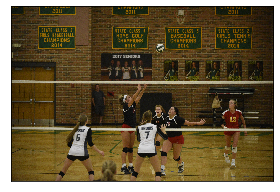


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171112_MUwrestling_JJ/20171112_MUwrestling_JJ_173.JPG
Classification for test image #1741: [10305.7880859375, -2582.940673828125, -8031.11279296875, -129.962158203125, 894.0054931640625, -192.32781982421875, -181.22348022460938, -81.80362701416016]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171030_BoonePointApartments_EJ/20171030_BoonePointApartments_EJ_001.JPG
Classification for test image #1742: [6065.08203125, -1310.1722412109375, -2952.8740234375, -619.1345825195312, -668.8465576171875, -216.93716430664062, -203.82748413085938, -92.11333465576172]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170824_MUfootballpractice_NC/20170824_mufootball_NC_053.JPG
Classification for test imag

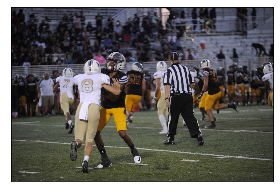


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170831_HickmanSoftball_OL/20170831_HickmanSoccer_OL_097.JPG
Classification for test image #1761: [3092.825439453125, 1047.7940673828125, -2505.99072265625, -515.8619384765625, -913.7454833984375, -87.08924102783203, -81.74392700195312, -36.77555847167969]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170922_ToltonFNSfb_EJ/20170922_ToltonFNSfb_EJ337.JPG
Classification for test image #1762: [12829.0224609375, 139.78062438964844, -9571.1142578125, -3550.79736328125, 703.8958129882812, -232.65675354003906, -218.72100830078125, -99.33763122558594]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171127_ApartmentMugs_EJ/20171127_ApartmentMugs_EJ_202.JPG
Classification for test image #1763: [3039.69

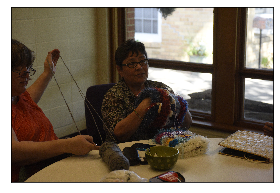


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170913_ShawnVeronika_OL/20170913_ShawnVeronika_OL_477.JPG
Classification for test image #1781: [9513.8408203125, -3276.685791015625, -4074.64697265625, -835.8551025390625, -713.5947265625, -258.9519348144531, -242.52484130859375, -110.20526885986328]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171208_nicparksQ&A/20171208_nicparksq&a_JJ_013.JPG
Classification for test image #1782: [5538.10009765625, 338.94305419921875, -5654.78564453125, -737.611572265625, 1019.3026123046875, -213.01478576660156, -200.058349609375, -90.61121368408203]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20171004_healthcoaches_EJ/20171004_HealthCoaches_EJ_062.JPG
Classification for test image #1783: [7064.19775390

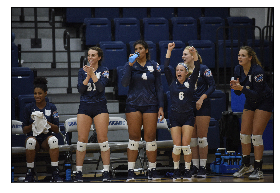


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20171026_musoc_nc/20171026_musoc_nc_087.JPG
Classification for test image #1801: [11088.7060546875, -1233.107177734375, -5467.064453125, 739.5257568359375, -4531.14892578125, -252.5537567138672, -236.78611755371094, -107.38883972167969]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171013_craftbeer_JJ_VOX/20171013_craftbeer_JJ_VOX_051.JPG
Classification for test image #1802: [13053.19140625, -4592.53662109375, -5420.560546875, -1444.4903564453125, -914.73876953125, -287.8050537109375, -270.31500244140625, -122.2628173828125]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170822_rally_EC/20170822_rally_EH_062.JPG
Classification for test image #1803: [-930.7161865234375, 4182.1484375, -1

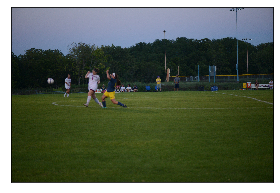


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170830_StephensSoccor_OL/20170830_StephensSoccer_OL_203.JPG
Classification for test image #1821: [5445.4521484375, 2533.147216796875, -5899.859375, 1224.911865234375, -2805.5771484375, -211.28379821777344, -199.02789306640625, -89.78706359863281]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170904_EStCharlesRdFeatureHunt/20170904_EStCharlesRdFeatureHunt_EJ_082.JPG
Classification for test image #1822: [922.6014404296875, -334.24188232421875, 4864.51611328125, -3298.049072265625, -886.73046875, -536.0988159179688, -503.3488464355469, -228.10328674316406]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170901_musoc_ec/20170901_musoc_Ec_559.JPG
Classification for test image #1823: [2114.397

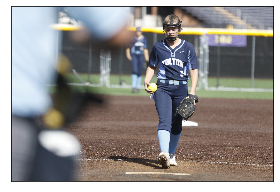


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170924_DDfarm_JJ/20170924_DDfarm_JJ_232.JPG
Classification for test image #1841: [527.8460083007812, -1679.2099609375, 4770.7255859375, -800.7894287109375, -1985.822509765625, -352.2906799316406, -331.1512145996094, -149.7676544189453]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20171116_muwbb_Ec/20171116_muwbb_ec_189.JPG
Classification for test image #1842: [7765.74853515625, 1481.09228515625, -6868.80517578125, -1717.869140625, 123.34892272949219, -330.4062805175781, -310.57501220703125, -140.7126922607422]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170907_ShawnVeronika_OL/20170907_ShawnVeronica_OL_466.JPG
Classification for test image #1843: [10670.1328125, -2199.688720703125, -

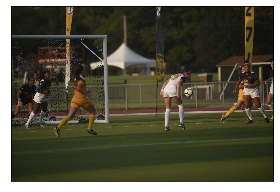


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170918HickmanSoftball_jd/20170918HickmanSoftball_jd_145.JPG
Classification for test image #1861: [4550.1552734375, -1930.7501220703125, 842.9990234375, -2141.447998046875, -476.332763671875, -356.5281066894531, -335.3587951660156, -151.5504913330078]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170906_CartwrightPresser_EJ/20170906_CartwrightPresser_EJ_264.JPG
Classification for test image #1862: [3931.045654296875, -1494.9306640625, -527.298828125, -623.996337890625, -990.22802734375, -123.61559295654297, -116.06005859375, -52.89171600341797]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170906_ToltonFootballPractice_OL/20170906_ToltonFootballPractice_OL_029.JPG
Classification for test imag

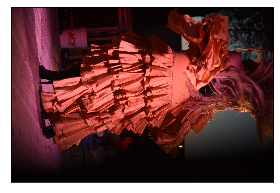


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170825_Rodeo_Ashland_ec/20170825_rodeo_EC_0495.JPG
Classification for test image #1881: [148.17245483398438, 1941.66845703125, 1599.5283203125, -1179.157470703125, -1937.3450927734375, -242.37088012695312, -227.63604736328125, -103.10234832763672]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170908_featurehunt_JJ/20170908_featurehunt_jj_018.JPG
Classification for test image #1882: [5274.99462890625, -1657.0350341796875, -2722.750732421875, 304.74444580078125, -909.8868408203125, -122.5450439453125, -115.06879425048828, -52.24281311035156]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170907_ShawnVeronika_OL/20170907_ShawnVeronica_OL_454.JPG
Classification for test image #1883: [15164

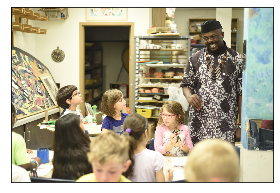


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20171020_acaenrollment_JJ/20171020_acaenrollment_JJ_114.JPG
Classification for test image #1901: [3398.714111328125, -36.09357833862305, -2562.77978515625, -139.34458923339844, -252.4598846435547, -172.401123046875, -161.58544921875, -73.16535186767578]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Cherryhomes, Ellie/20170830_Trump_EC/20170830_Trump_EC_025.JPG
Classification for test image #1902: [5851.16455078125, -1019.6502685546875, -3611.58154296875, -1567.979248046875, 901.7825927734375, -233.88922119140625, -220.15908813476562, -99.21041107177734]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Emily/20170904_HeartofAmericaMarathon_EJ/20170904_HeartofAmericaMarathon_EJ_1044.JPG
Classification for test image 

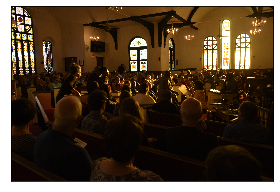


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Dodge, Jessi/20170918_Hickmansoccer_jd/20170918HickmanSoccer_jd_038.JPG
Classification for test image #1921: [10177.3583984375, 1804.5802001953125, -9213.0322265625, -1457.380126953125, -543.296875, -324.8867492675781, -305.2382507324219, -138.2519073486328]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170830_StephensSoccor_OL/20170830_StephensSoccer_OL_1376.JPG
Classification for test image #1922: [10404.0263671875, 726.576416015625, -7459.595703125, 458.4773254394531, -3362.3251953125, -325.0600280761719, -305.1094970703125, -138.03810119628906]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170907_tomatofest_nc/20170907_tomatofestival_nc_227.JPG
Classification for test image #1923: [3228.73046875, 2353.9

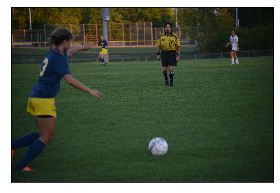


Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Compton, Nate/20170921_mktbridges_nc/20170921_mktbridges_nc_193.JPG
Classification for test image #1941: [6282.2021484375, 249.5762176513672, -4502.6123046875, -748.78955078125, -902.1884155273438, -160.38754272460938, -150.12860107421875, -67.89031982421875]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Johnson, Jeremy/20170929_MUbbpress_JJ/20170928_mubbpress_JJ_335.JPG
Classification for test image #1942: [8042.2451171875, -3320.057861328125, -3695.42236328125, 427.0274658203125, -1072.561279296875, -160.9368896484375, -151.01651000976562, -68.2584457397461]
Empty DataFrame
Columns: [1, 2, 3, 4, 5, 6, 7, 8, file_path]
Index: []

Image path: /mnt/md0/mysql-dump-economists/Archives/2017/Fall/Dump/Liu, Olivia/20170823_BattleSoftball_OL/20170823_Battlesoftball_OL_431.JPG
Classification for test image #1943: [6547.44921875, -1149.

OSError: image file is truncated (53 bytes not processed)

In [3]:

limit_num_pictures = 13490
vgg16.eval() # set model to evaluation/prediction mode
testing_loss = 0
testing_accuracy = 0
running_loss = 0.0
num_correct = 0

ratings_data = None
for i, data in enumerate(test_loader, 0):
    
    if limit_num_pictures:
        if i > limit_num_pictures:
            break
    inputs, _, path, label = data
    path = path[0]
    label = torch.LongTensor([int(label[0])])

    output = vgg16(inputs)
    loss = criterion(output, label)

    running_loss += loss.item()
    _, preds = torch.max(output.data, 1)
    num_correct += (preds == label).sum().item()
    ratings = output[0].tolist()
    print("\nImage path: {}".format(path))
    print("Classification for test image #{}: {}".format(i, ratings))
    tuple_to_insert = {}
    for n in range(8):
        tuple_to_insert[str(n + 1)] = [ratings[n]]
    tuple_to_insert['file_path'] = [path]
    tuple_to_insert = pandas.DataFrame.from_dict(tuple_to_insert)

    if i == 0:
        ratings_data = tuple_to_insert
    else:
        ratings_data = ratings_data.append(tuple_to_insert, ignore_index=True)
    print(ratings_data.tail(0))
    if i % 20 == 0:
        fig = plt.figure(figsize=(16, 4))
        columns = 3
        rows = 1
        img = mpimg.imread(path)
        fig.add_subplot(rows, columns, 1)
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])
        plt.show()

testing_loss = running_loss/len(test_loader.dataset)
testing_accuracy = 100. * num_correct/len(test_loader.dataset)
ratings_data = ratings_data.set_index('file_path')

#### Scaling:
The results returned from simple testing skewed heavily to the two ends of the rating spectrum. We solved this through Standard Scaling which follows $z = (x - u)/s$ where "s" is the sample (number) of testing images, "u" is the calculated mean, and "z" is the z-score of the data. We turn the results into a useable dataframe and store it off.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fca96cb7890>,
      dtype=object)

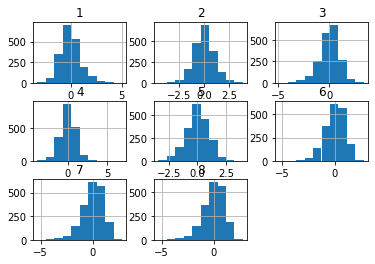

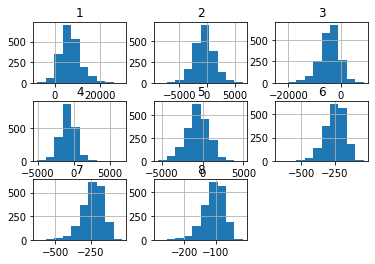

In [5]:
from sklearn.preprocessing import StandardScaler
ratings_data = ratings_data.set_index('file_path')
scaler = StandardScaler() 
space_1 = scaler.fit_transform(ratings_data)
ratings_data_norm = pd.DataFrame(space_1, columns=ratings_data.columns, index=ratings_data.index)
ratings_data_norm.hist()
ratings_data.hist()

In [6]:
ratings_data_norm['classification'] = ratings_data_norm.idxmax(axis=1)
ratings_data_norm = ratings_data_norm.sort_values(by=['classification'])
ratings_data_norm
bad_images = ratings_data_norm.loc[ratings_data_norm['classification'] == '8']
good_images = ratings_data_norm.loc[ratings_data_norm['classification'] == '1']

#### Displaying Images:
Finally we can display the good and bad images. The first set of images is deemed "good" by the model, the second set is "bad".

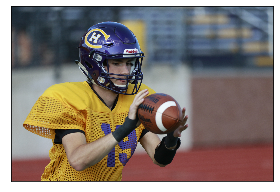

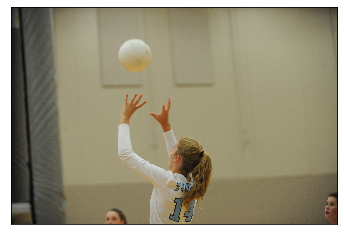

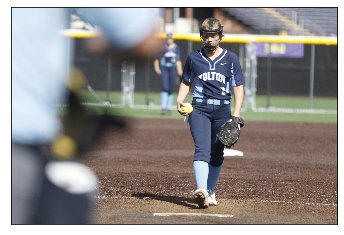

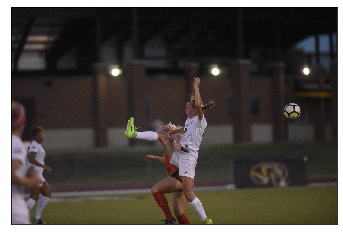

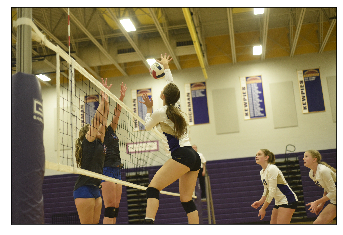

In [7]:
fig = plt.figure(figsize=(16, 4))
for path in good_images.head().index:
    columns = 3
    rows = 1
    img = mpimg.imread(path)
    fig.add_subplot(rows, columns, 1)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

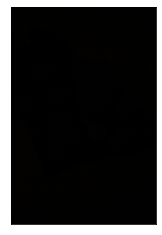

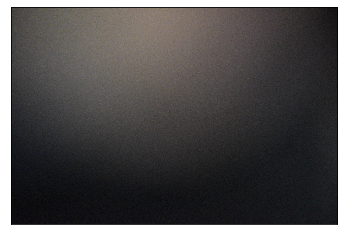

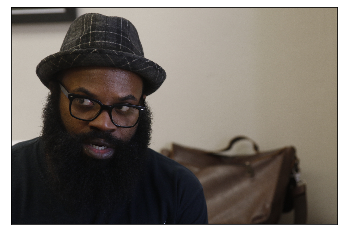

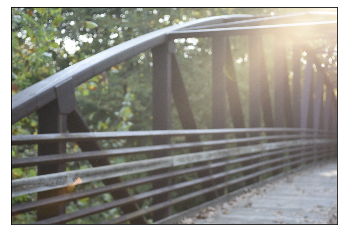

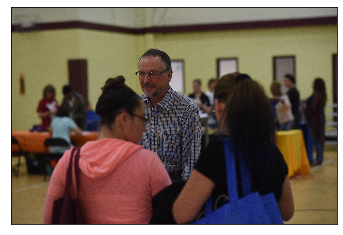

In [8]:
# fig = plt.figure(figsize=(16, 4))
for path in bad_images.head().index:
    columns = 3
    rows = 1
    img = mpimg.imread(path)
    fig.add_subplot(rows, columns, 1)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

#### Next Steps:
We have several next steps to generate faster and more accurate ratings:
1. To speed up displays of images we intend to generate thumbnails of each of the photos and display those to users instead of the full images themselves. 
2. After this we shall build several models to test on different combinations of datasets including AVA, color class rankings, and various scaled combinations. 
3. Finally we will build a classification model intended to be added to the front of the pipeline. This model would classify the images into subsets and then attempt to rank against like images rather than rank against the whole set. We believe this will make the rankings substantially more useful.